## 데이터 가져오기

**[문제]**

농업 연구에서는 식물이 성장하는 동안 중요한 순간을 관찰하는 것이 중요하다. 하지만 몇가지 중요한 식물은 여전히 수동으로 측정되고 있다. 그 중 하나의 예가 디지털 사진을 보고 밀 귀를 수동으로 세는 것이다. 매우 길고 지루한 작업이다. 이 작업을 어렵게 만드는 요소에는 겹치는 밀 귀, 밀의 성숙도와 유전형에 따라 달라지는 외형, 존재하거나 부재하는 미늘, 머리의 방향이나 심지어는 바람에도 영향을 받는다.

**[데이터셋]**

- **train.zip** - 훈련 이미지.jpg (3422장)
- **test.zip** - 테스트 이미지.jpg (10장)
- **train.csv** - 훈련 이미지에 대한 데이터(147793)
- **sample_submission.csv** - 제출하는 파일(4개 사진의 박스 좌표, 넓이, 높이)

**[train.csv 안에 포함된 요소들]**
* image_id - 이미지의 고유번호
* width - 이미지의 넓이
* height - 이미지의 높이
* bbox - [xmin, ymin, width, height]의 Python 스타일 목록으로 형식이 지정된 경계 상자
* source - 데이터 출처 = 연구소 이름


In [1]:
import pandas as pd # package for high-performance, easy-to-use data structures and data analysis
import numpy as np # fundamental package for scientific computing with Python
import matplotlib
import os
from PIL import Image, ImageDraw
from ast import literal_eval
import matplotlib.pyplot as plt # for plotting
import seaborn as sns # for making plots with seaborn
color = sns.color_palette()
import plotly.offline as py
py.init_notebook_mode(connected=True)
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.offline as offline
offline.init_notebook_mode()

#### Reading data - 데이터 위치로 변수 설정

In [2]:
BASE_PATH = '/home/hyejoo/work/repos/minseo/global-wheat-detection'
TRAIN_DIR = f'{BASE_PATH}/train'
TEST_DIR = f'{BASE_PATH}/test'

train = pd.read_csv(f'{BASE_PATH}/train.csv')
submission = pd.read_csv(f'{BASE_PATH}/sample_submission.csv')


In [3]:
print('Size of train data', train.shape)
print('Size of submission file', submission.shape)

Size of train data (147793, 5)
Size of submission file (10, 2)


train data에는 147793개의 bounding box들이 있음

#### train data

In [4]:
# train 데이터가 어떻게 생겼는지 보기 limit 5- 엑셀에서 보이는거와 같음
display(train.head())

,image_id,width,height,bbox,source
0,b6ab77fd7,1024,1024,"[834.0, 222.0, 56.0, 36.0]",usask_1
1,b6ab77fd7,1024,1024,"[226.0, 548.0, 130.0, 58.0]",usask_1
2,b6ab77fd7,1024,1024,"[377.0, 504.0, 74.0, 160.0]",usask_1
3,b6ab77fd7,1024,1024,"[834.0, 95.0, 109.0, 107.0]",usask_1
4,b6ab77fd7,1024,1024,"[26.0, 144.0, 124.0, 117.0]",usask_1


In [5]:
print(f'Number of unique images in train data is {len(list(np.unique(train.image_id)))}')

Number of unique images in train data is 3373


In [17]:
print(len(list(np.unique(train.image_id))))

3373


train data의 고유 이미지는 3373개

In [6]:
display(train.describe())

,width,height
count,147793.0,147793.0
mean,1024.0,1024.0
std,0.0,0.0
min,1024.0,1024.0
25%,1024.0,1024.0
50%,1024.0,1024.0
75%,1024.0,1024.0
max,1024.0,1024.0


describe () 함수는 DataFrame 열과 관련된 통계 요약을 계산합니다.

모든 사진은 1024x1024인 것을 볼 수 있음.

#### submission file

=올바른 형식의 제출 파일

In [7]:
display(submission.head())

,image_id,PredictionString
0,aac893a91,1.0 0 0 50 50
1,51f1be19e,1.0 0 0 50 50
2,f5a1f0358,1.0 0 0 50 50
3,796707dd7,1.0 0 0 50 50
4,51b3e36ab,1.0 0 0 50 50


### Check for missing values

* 결측값은 입력이 누락된 값을 의미합니다
* 결측값은 분석 오류를 발생시키거나 혹은 왜곡시킬 위험
* 따라서 데이터가 있으면 꼭 결측값이 있는지 확인해야 한다.
* isnull() 메소드는 관측치가 결측이면 True를 반환한다.
* 칼럼별 결측값 개수 구하기 : df.isnull().sum()
* 출처: https://rfriend.tistory.com/260 [R, Python 분석과 프로그래밍의 친구 (by R Friend)]

In [19]:
# checking missing data
total = train.isnull().sum().sort_values(ascending = False)
percent = (train.isnull().sum()/train.isnull().count()*100).sort_values(ascending = False)
missing_train_data  = pd.concat([total, percent], axis=1, keys=['Total', 'Percent'])
missing_train_data.head()


,Total,Percent
source,0,0.0
bbox,0,0.0
height,0,0.0
width,0,0.0
image_id,0,0.0


## Exploratory Data Analysis (EDA)

#### Checking for data source distribution - 데이터 소스 분배 확인하기

In [9]:
def plot_count(df, feature, title='', size=2):
    f, ax = plt.subplots(1,1, figsize=(4*size,3*size))
    total = float(len(df))
    sns.countplot(df[feature],order = df[feature].value_counts().index, palette='Set2')
    plt.title(title)
    for p in ax.patches:
        height = p.get_height()
        ax.text(p.get_x()+p.get_width()/2.,
                height + 3,
                '{:1.2f}%'.format(100*height/total),
                ha="center") 
    plt.show()

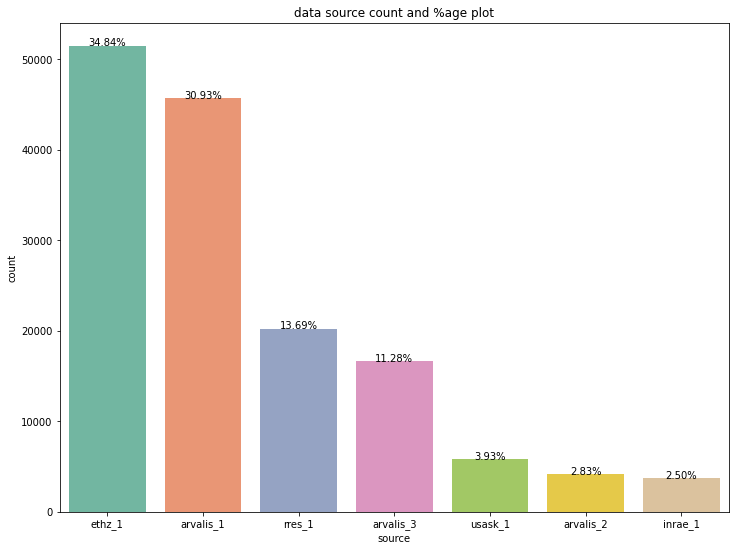

In [10]:
plot_count(df=train, feature='source', title = 'data source count and %age plot', size=3)

* source = 연구소 이름
* ethz_1과 arvalis_1은 2 개의 주요 데이터 소스입니다 (총 데이터의 약 65 % 0f 기여).
* 제공된 소스 측면에서 데이터 세트의 균형이 맞지 않습니다.

## Visualizing images with bounding boxes (이미지 시각화)

###  train images

In [20]:
def display_images_large(images): 
    f, ax = plt.subplots(5,2, figsize=(20, 50))
    for i, image_id in enumerate(images):
        image_path = os.path.join(TRAIN_DIR, f'{image_id}.jpg')
        image = Image.open(image_path)        
        bboxes = [literal_eval(box) for box in train[train['image_id'] == image_id]['bbox']]
        # draw rectangles on image
        draw = ImageDraw.Draw(image)
        for bbox in bboxes:    
            draw.rectangle([bbox[0], bbox[1], bbox[0] + bbox[2], bbox[1] + bbox[3]], width=3)
            
        ax[i//2, i%2].imshow(image) 
        ax[i//2, i%2].axis('off')
        source = train[train['image_id'] == image_id]['source'].values[0]
        ax[i//2, i%2].set_title(f"image_id: {image_id}\nSource: {source}")

    plt.show()

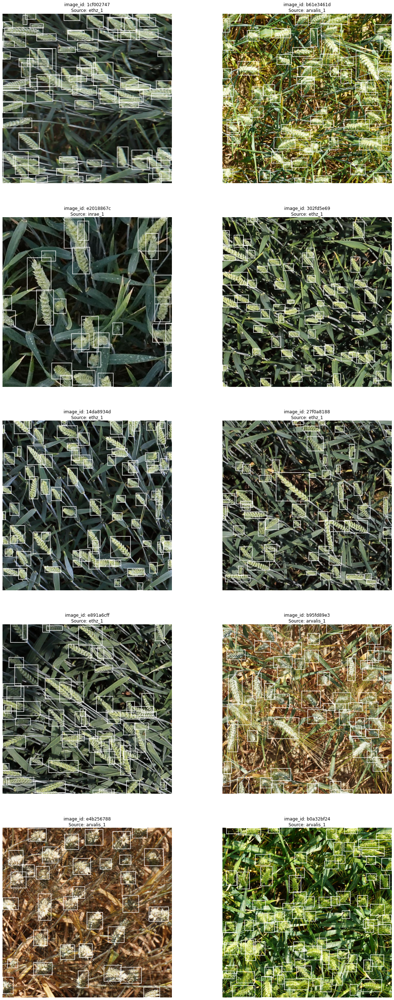

In [21]:
images = train.sample(n=10, random_state=42)['image_id'].values
display_images_large(images)

In [22]:
def display_images(images): 
    f, ax = plt.subplots(5,3, figsize=(18,22))
    for i, image_id in enumerate(images):
        image_path = os.path.join(TRAIN_DIR, f'{image_id}.jpg')
        image = Image.open(image_path)
        
        # get all bboxes for given image in [xmin, ymin, width, height]
        bboxes = [literal_eval(box) for box in train[train['image_id'] == image_id]['bbox']]
        # draw rectangles on image
        draw = ImageDraw.Draw(image)
        for bbox in bboxes:    
            draw.rectangle([bbox[0], bbox[1], bbox[0] + bbox[2], bbox[1] + bbox[3]], width=3)
            
        ax[i//3, i%3].imshow(image) 
        image.close()       
        ax[i//3, i%3].axis('off')

        source = train[train['image_id'] == image_id]['source'].values[0]
        ax[i//3, i%3].set_title(f"image_id: {image_id}\nSource: {source}")

    plt.show() 

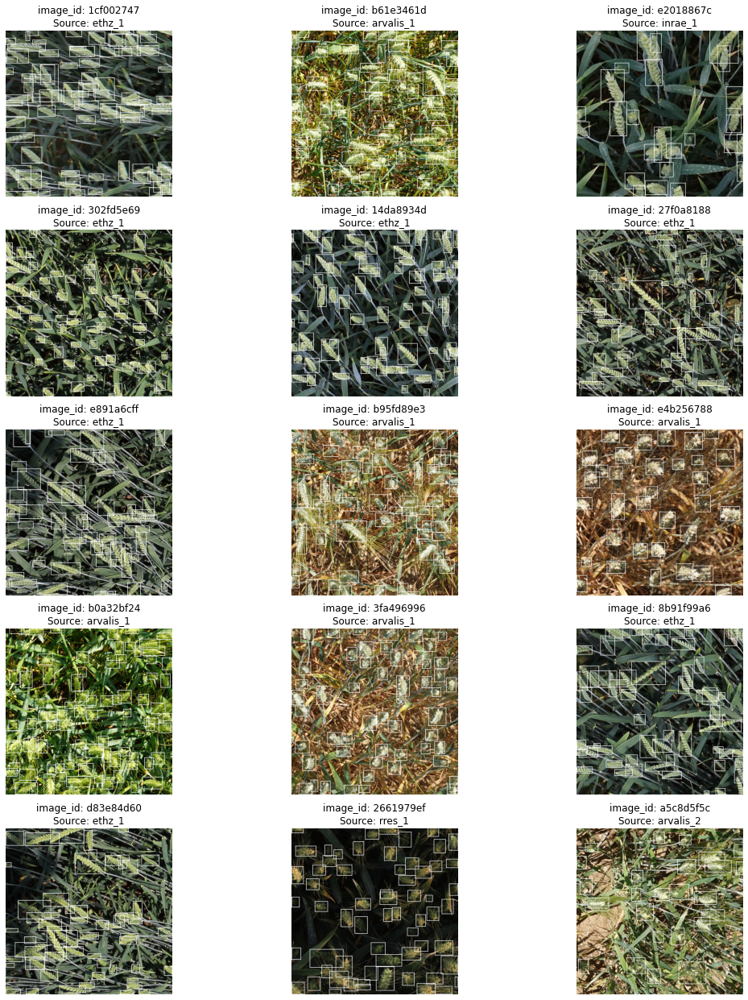

In [23]:
images = train.sample(n=15, random_state=42)['image_id'].values
display_images(images)

### 가까이 보기

### Visualizing test images

In [15]:
def display_test_images(images): 
    f, ax = plt.subplots(5,2, figsize=(20, 50))
    for i, image_id in enumerate(images):
        image_path = os.path.join(TEST_DIR, f'{image_id}.jpg')
        image = Image.open(image_path)        
            
        ax[i//2, i%2].imshow(image) 
        ax[i//2, i%2].axis('off')
        ax[i//2, i%2].set_title(f"image_id: {image_id}")

    plt.show()

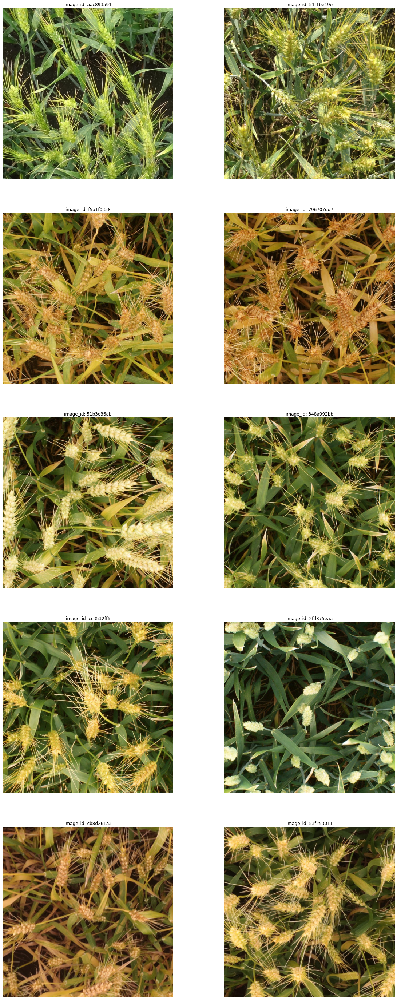

In [16]:
# bounding box를 예측해야하므로 아래의 이미지에는 bounding box가 없음
test_images = submission.image_id.values
display_test_images(test_images)